# Detected Faces Deep Learning Classification
---
Final face image classification with application of convolutional and capsule PyTorch neural network.

In [1]:
import os
import csv
import pickle

import numpy as np
import pandas as pd
from PIL import Image, ImageDraw

import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

import torch
from torchvision import models, transforms
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchvision

from sklearn.metrics import accuracy_score, f1_score

from src.data_loader import MaskedFacesExamples, Config
from src.models.capsnet import CapsNet

from src.human_silhouette_detector import detect_human_silhouettes_and_faces
from src.visualize import show_images, show_many_images

/home/jakub/Dokumenty/venv36/lib/python3.6/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0
/home/jakub/Dokumenty/venv36/lib/python3.6/site-packages/torch/serialization.py:658: SourceChangeWarning: source code of class 'MainModel.KitModel' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/home/jakub/Dokumenty/venv36/lib/python3.6/site-packages/torch/serialization.py:658: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original sou

In [2]:
plt.style.use('ggplot')

In [56]:
FIELDS = ['anti-COVID19 mask', 'balaclava', 'scarf', 'other cloth', 'hair', 'handkerchief', 'hands',
          'beard', 'glasses', 'head covering', 'other masking', 'COVID-19 correct']
FIELDS_PL = ['maseczka anty COVID-19', 'kominiarka', 'szalik', 'inne ubranie', 'włosy', 'chusteczka', 'dłonie',
          'broda', 'okulary', 'nakrycie głowy', 'inne', 'poprawnie założona maseczka']
DEVICE = 'cpu'
LANG = 'pl'

## Annotated faces dataset

In [4]:
df_annotations = pd.read_csv('adv_detected_faces_annotations_all.csv')
if LANG == 'pl':
    df_annotations = df_annotations.rename(columns=dict(zip(FIELDS, FIELDS_PL)))
df_annotations = df_annotations.drop(['File'], axis=1)
df_annotations

,anti-COVID19 mask,balaclava,scarf,other cloth,hair,handkerchief,hands,beard,glasses,head covering,other masking,COVID-19 correct
0,0,0,0,0,1,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,1,0
4,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
5514,0,0,0,1,0,0,0,0,0,0,1,1
5515,1,0,0,0,0,0,0,0,0,0,0,1
5516,1,0,0,0,1,0,0,0,0,0,0,1
5517,0,0,0,0,0,0,0,0,0,0,0,0


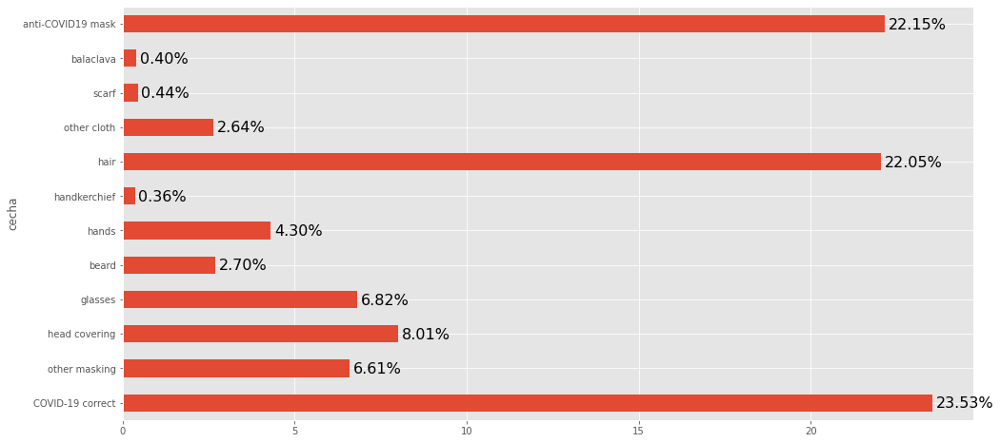

In [5]:
srs = df_annotations.sum()
df_srs = pd.DataFrame({
    'cecha': srs.index.values[::-1],
    '%': [v/np.sum(srs.values)*100 for v in srs.values[::-1]]
})
df_srs = df_srs.set_index(['cecha'])

ax = df_srs.plot(kind='barh', figsize=(16, 8))
ax.get_legend().remove()
for p in ax.patches:
    plt.text(0.1+p.get_width(), p.get_y()+0.2*p.get_height(), f'{p.get_width():1.2f}%', fontsize=16)

## Single face examples

### Faces

In [6]:
ids = [3, 177, 708, 730, 907, 3292, 3444, 3781, 4934, 4954]
faces = [Image.open(f'detected_faces/face{i}.png') for i in ids]
titles = [f'face{i}.png' for i in ids]

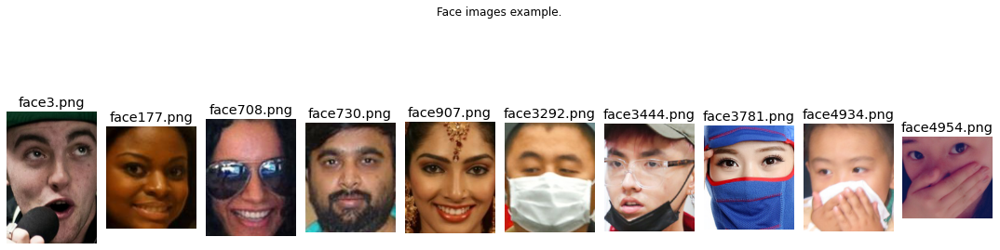

In [7]:
show_images(faces, titles, suptitle='Face images example.')

### Dataset

In [8]:
data_transform = transforms.Compose([
    transforms.Resize([32, 32], interpolation=Image.BICUBIC),
    transforms.ToTensor(),
])

config = Config()
dataset = MaskedFacesExamples(faces, transform=data_transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=100, shuffle=False)

### Model

In [9]:
capsule_net = CapsNet(config)
capsule_net = capsule_net.to(DEVICE)
capsule_net.eval()

CapsNet(
  (conv_layer): ConvLayer(
    (conv): Conv2d(3, 256, kernel_size=(9, 9), stride=(1, 1))
  )
  (primary_capsules): PrimaryCaps(
    (capsules): ModuleList(
      (0): Conv2d(256, 32, kernel_size=(9, 9), stride=(2, 2))
      (1): Conv2d(256, 32, kernel_size=(9, 9), stride=(2, 2))
      (2): Conv2d(256, 32, kernel_size=(9, 9), stride=(2, 2))
      (3): Conv2d(256, 32, kernel_size=(9, 9), stride=(2, 2))
      (4): Conv2d(256, 32, kernel_size=(9, 9), stride=(2, 2))
      (5): Conv2d(256, 32, kernel_size=(9, 9), stride=(2, 2))
      (6): Conv2d(256, 32, kernel_size=(9, 9), stride=(2, 2))
      (7): Conv2d(256, 32, kernel_size=(9, 9), stride=(2, 2))
    )
  )
  (digit_capsules): DigitCaps()
  (decoder): Decoder(
    (reconstraction_layers): Sequential(
      (0): Linear(in_features=32, out_features=512, bias=True)
      (1): ReLU(inplace=True)
      (2): Linear(in_features=512, out_features=1024, bias=True)
      (3): ReLU(inplace=True)
      (4): Linear(in_features=1024, out_featur

### Test

In [10]:
predictions = list([])

for field in FIELDS:
    field_name = field.replace(" ", "_")
    capsule_net.load_state_dict(torch.load(f'src/models/MFC-{field_name}.pt'))

    with torch.no_grad():

        for data in dataloader:
            data = torch.autograd.Variable(data)
            data = data.to(DEVICE)

            _, _, pred = capsule_net(data)
            pred = np.argmax(pred.data.cpu().numpy(), 1)
    predictions.append(pred)
predictions = np.array(predictions)
predictions

array([[0, 0, 0, 0, 0, 1, 0, 1, 0, 0],
       [1, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 1, 0, 1],
       [1, 0, 1, 0, 0, 0, 1, 1, 0, 0],
       [1, 0, 0, 1, 1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 1, 0, 0, 1],
       [1, 0, 1, 1, 0, 1, 1, 0, 1, 1],
       [1, 0, 0, 1, 0, 0, 1, 1, 0, 0],
       [1, 0, 1, 0, 0, 0, 1, 1, 0, 1],
       [1, 0, 1, 0, 0, 0, 1, 1, 0, 1],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 1],
       [0, 0, 0, 0, 0, 1, 0, 1, 1, 0]])

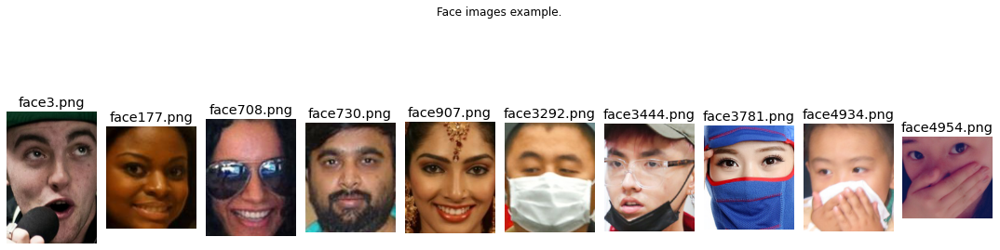

In [11]:
show_images(faces, titles, suptitle='Face images example.')

In [12]:
predictions_df = pd.DataFrame(predictions, index=FIELDS, columns=titles)
predictions_df

,face3.png,face177.png,face708.png,face730.png,face907.png,face3292.png,face3444.png,face3781.png,face4934.png,face4954.png
anti-COVID19 mask,0,0,0,0,0,1,0,1,0,0
balaclava,1,0,1,0,0,0,1,1,0,0
scarf,1,0,0,0,0,0,1,1,0,1
other cloth,1,0,1,0,0,0,1,1,0,0
hair,1,0,0,1,1,0,1,0,0,0
handkerchief,1,0,0,0,0,0,1,0,0,1
hands,1,0,1,1,0,1,1,0,1,1
beard,1,0,0,1,0,0,1,1,0,0
glasses,1,0,1,0,0,0,1,1,0,1
head covering,1,0,1,0,0,0,1,1,0,1


## Face examples detected on images

### Images

In [13]:
names = ['no_mask0.jpg', 'no_mask1.jpg', 'mask0.jpg', 'mask1.jpg', 'crim0.jpg', 'crim1.jpg']
images = [Image.open(f'images/final/{n}') for n in names]
titles = [n.replace('.jpg', '') for n in names]

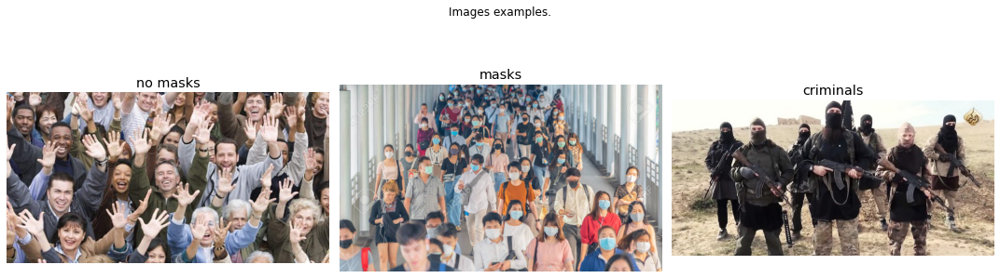

In [14]:
show_images([images[0], images[2], images[4]], ['no masks', 'masks', 'criminals'],
            suptitle='Images examples.')

### Faces

In [15]:
def face_images(img):
    coords, _, _ = detect_human_silhouettes_and_faces(img)
    f_imgs = [img.crop(tuple(c)) for c in coords]
    
    return coords, f_imgs

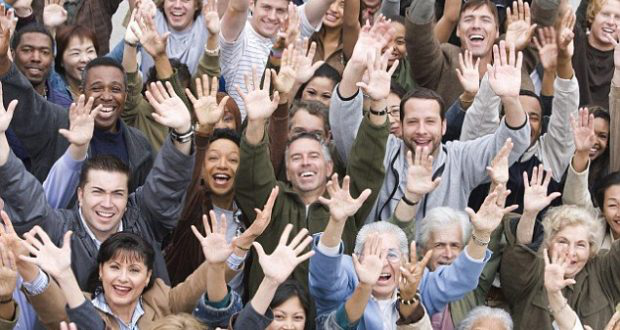

In [16]:
images[0]

/home/jakub/Dokumenty/venv36/lib/python3.6/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


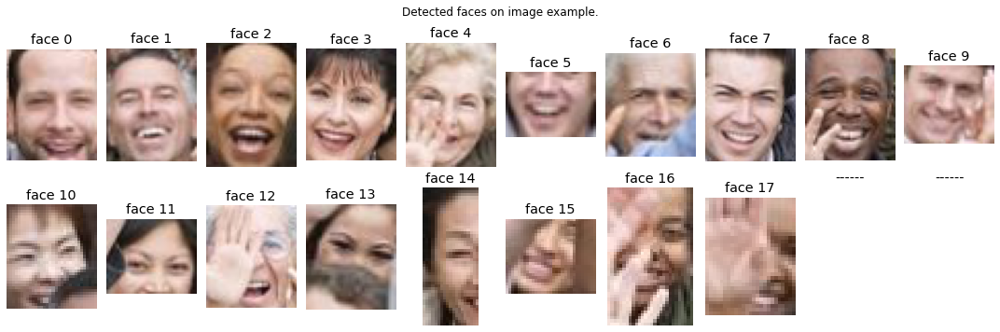

In [17]:
f_coords, f_images = face_images(images[0])
f_titles = [f'face {i}' for i in range(len(f_images))]
show_many_images(f_images, f_titles, suptitle='Detected faces on image example.')

### Dataset + Model + Visual

In [18]:
def get_predictions(f_imgs, return_df=False):
    data_transform = transforms.Compose([
        transforms.Resize([32, 32], interpolation=Image.BICUBIC),
        transforms.ToTensor(),
    ])

    config = Config()
    dataset = MaskedFacesExamples(f_images, transform=data_transform)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=100, shuffle=False)

    capsule_net = CapsNet(config)
    capsule_net = capsule_net.to(DEVICE)
    capsule_net.eval()

    predictions = list([])

    for field in FIELDS:
        field_name = field.replace(" ", "_")
        capsule_net.load_state_dict(torch.load(f'src/models/MFC-{field_name}.pt'))

        with torch.no_grad():

            for data in dataloader:
                data = torch.autograd.Variable(data)
                data = data.to(DEVICE)

                _, _, pred = capsule_net(data)
                pred = np.argmax(pred.data.cpu().numpy(), 1)
        predictions.append(pred)
    predictions = np.array(predictions)
    
    if return_df:
        return pd.DataFrame(predictions, index=FIELDS, columns=[f'face {i}' for i in range(len(f_imgs))])
    else:
        return predictions

def highlight_field(image, coords, pred_df, field, title='Detection highlights.'):
    vals = pred_df.T[field].values
    draw = ImageDraw.Draw(image)
    
    for c, v in zip(coords, vals):
        color = 'red' if v==0 else 'green'
        cc = [(c[0], c[1]), (c[2], c[3])]
        draw.rectangle(cc, outline=color, width=2)
    
    img = np.array(image)
    
    plt.figure(figsize=(16, 16))
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [19]:
f_preds = get_predictions(f_images, return_df=True)
f_preds

,face 0,face 1,face 2,face 3,face 4,face 5,face 6,face 7,face 8,face 9,face 10,face 11,face 12,face 13,face 14,face 15,face 16,face 17
anti-COVID19 mask,0,0,0,1,0,0,1,1,0,1,1,1,0,1,1,0,0,0
balaclava,0,0,0,0,0,0,0,0,0,1,1,1,1,0,1,1,1,1
scarf,0,0,0,0,0,0,0,0,0,1,1,1,1,0,1,1,1,1
other cloth,0,0,0,0,0,0,0,0,1,0,1,1,1,0,1,1,1,1
hair,0,0,0,1,1,0,0,0,0,0,1,1,0,0,1,1,0,1
handkerchief,0,0,0,0,1,0,0,0,1,1,0,1,1,0,1,1,1,1
hands,0,0,0,0,0,0,0,0,1,0,1,1,1,0,1,1,1,1
beard,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,1,1
glasses,1,0,0,0,1,0,1,0,1,0,0,1,0,0,1,0,1,0
head covering,0,0,0,0,1,0,0,0,1,1,1,1,0,1,1,1,0,1


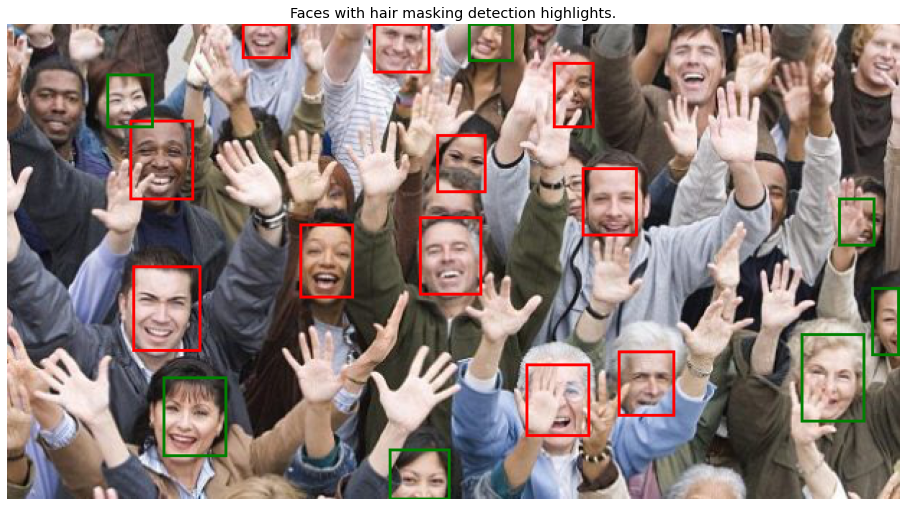

In [20]:
highlight_field(images[0], f_coords, f_preds, field='hair',
                title='Faces with hair masking detection highlights.')

### Test #01

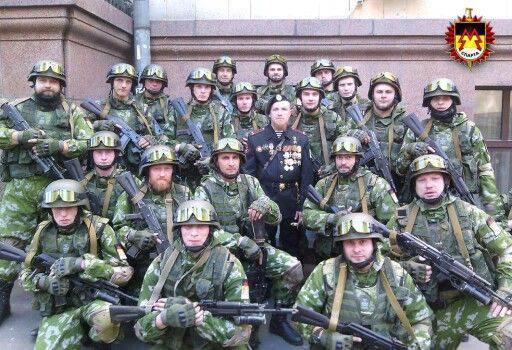

In [21]:
images[1]

/home/jakub/Dokumenty/venv36/lib/python3.6/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


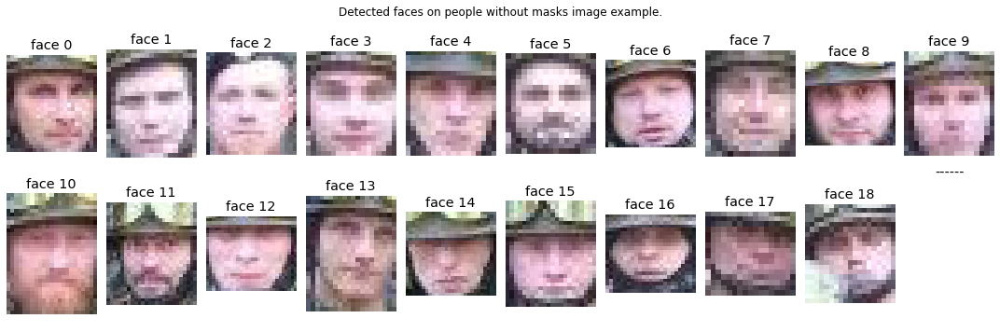

In [22]:
f_coords, f_images = face_images(images[1])
f_titles = [f'face {i}' for i in range(len(f_images))]
show_many_images(f_images, f_titles, suptitle='Detected faces on people without masks image example.')

In [23]:
f_preds = get_predictions(f_images, return_df=True)
f_preds

,face 0,face 1,face 2,face 3,face 4,face 5,face 6,face 7,face 8,face 9,face 10,face 11,face 12,face 13,face 14,face 15,face 16,face 17,face 18
anti-COVID19 mask,0,0,0,1,1,0,1,0,1,1,0,1,0,0,0,1,1,1,1
balaclava,0,0,0,1,1,0,0,0,0,0,1,1,0,1,0,1,0,1,1
scarf,0,0,0,0,1,0,0,0,0,0,1,0,1,1,1,0,0,1,1
other cloth,0,0,0,1,1,0,0,1,0,0,1,0,1,1,0,1,0,1,1
hair,1,1,0,1,0,0,1,1,0,1,1,1,1,1,0,0,0,0,0
handkerchief,1,0,0,0,1,0,0,1,0,0,1,0,1,1,1,1,0,1,1
hands,0,1,0,0,1,0,0,1,0,1,1,1,0,1,0,1,0,1,1
beard,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0,1,1
glasses,0,0,0,0,0,0,1,0,0,0,1,1,0,0,1,1,0,0,1
head covering,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,1,0,1


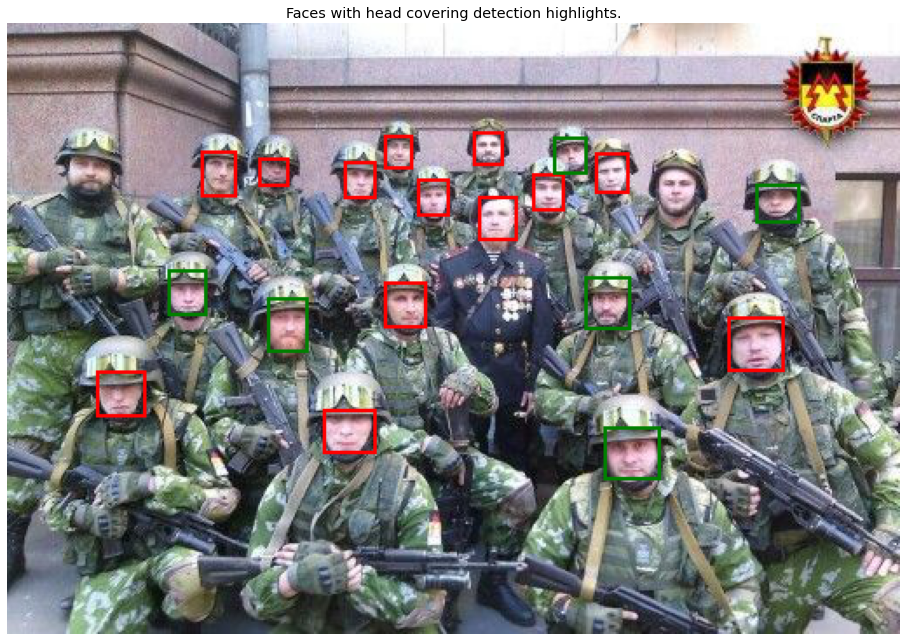

In [24]:
highlight_field(images[1], f_coords, f_preds, field='head covering',
                title='Faces with head covering detection highlights.')

### Test #02

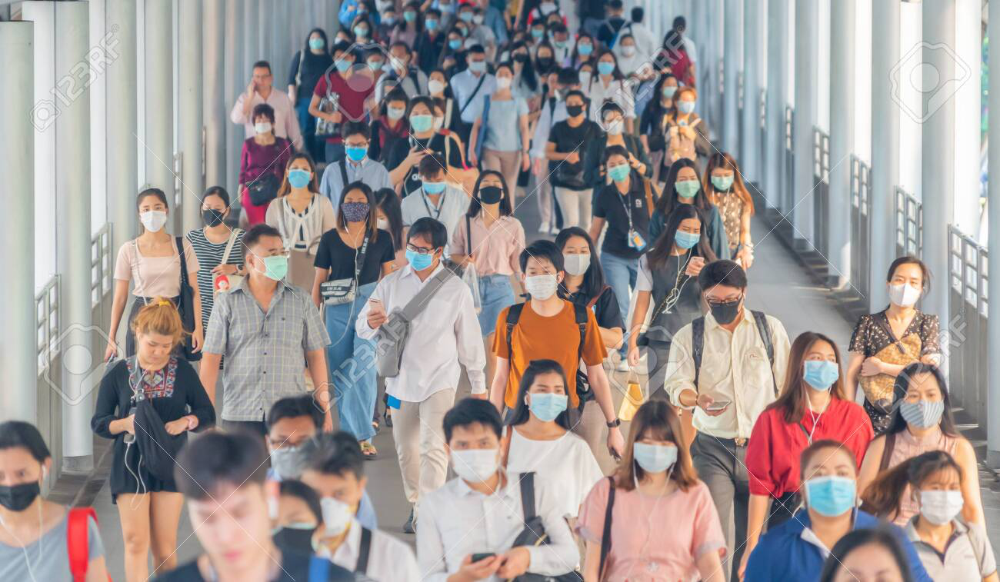

In [25]:
images[2]

/home/jakub/Dokumenty/venv36/lib/python3.6/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


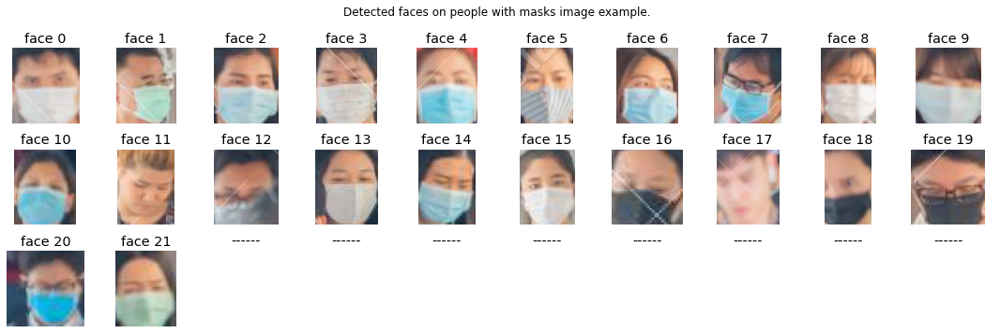

In [26]:
f_coords, f_images = face_images(images[2])
f_titles = [f'face {i}' for i in range(len(f_images))]
show_many_images(f_images, f_titles, suptitle='Detected faces on people with masks image example.')

In [27]:
f_preds = get_predictions(f_images, return_df=True)
f_preds

,face 0,face 1,face 2,face 3,face 4,face 5,face 6,face 7,face 8,face 9,...,face 12,face 13,face 14,face 15,face 16,face 17,face 18,face 19,face 20,face 21
anti-COVID19 mask,1,1,1,1,1,1,1,1,1,1,...,0,1,1,1,1,0,0,1,1,1
balaclava,0,1,0,0,0,0,0,1,1,1,...,1,0,0,0,0,1,1,0,0,0
scarf,0,1,0,0,0,0,1,1,1,0,...,1,0,0,0,1,0,1,0,0,0
other cloth,0,0,0,0,0,0,1,1,1,1,...,1,0,0,1,1,0,1,0,1,0
hair,0,0,0,0,0,0,1,1,1,1,...,1,0,1,1,0,1,0,0,0,0
handkerchief,0,1,0,0,0,0,1,1,1,0,...,1,0,1,0,1,1,1,0,0,0
hands,0,1,0,0,0,0,1,0,1,0,...,1,0,1,1,0,0,1,0,1,0
beard,0,1,0,0,0,0,1,1,1,0,...,1,0,1,0,0,0,1,0,1,0
glasses,0,1,0,0,1,1,1,0,1,0,...,1,1,0,0,0,1,1,1,0,0
head covering,0,1,0,0,0,0,1,1,1,1,...,1,0,0,0,0,0,0,0,1,0


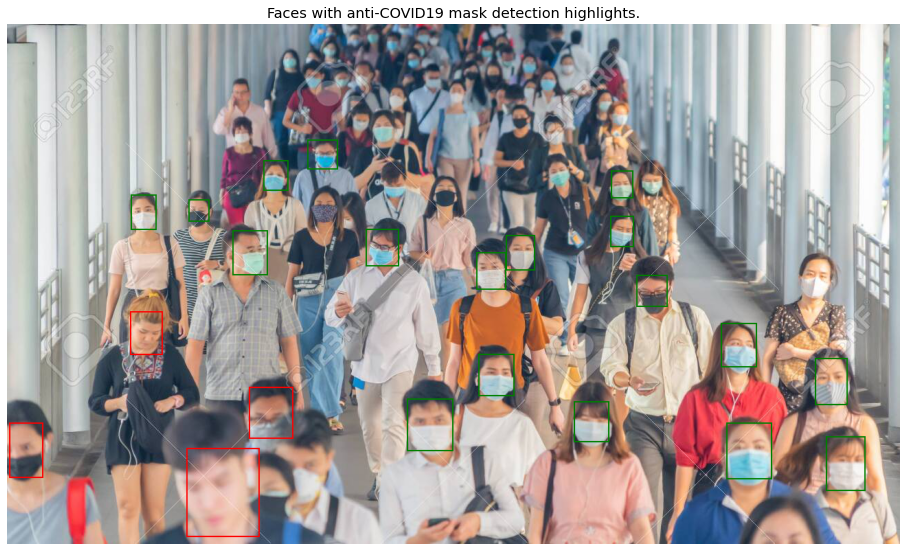

In [28]:
highlight_field(images[2], f_coords, f_preds, field='anti-COVID19 mask',
                title='Faces with anti-COVID19 mask detection highlights.')

### Test #03

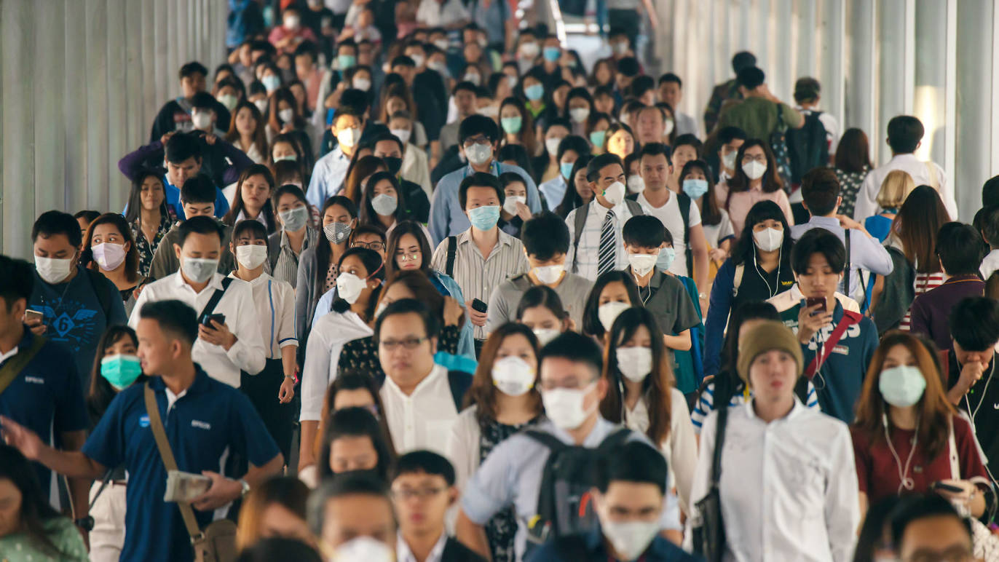

In [29]:
images[3]

/home/jakub/Dokumenty/venv36/lib/python3.6/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


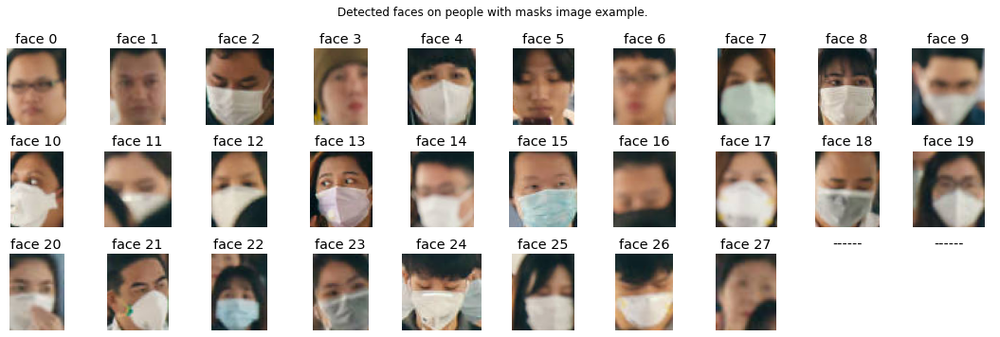

In [30]:
f_coords, f_images = face_images(images[3])
f_titles = [f'face {i}' for i in range(len(f_images))]
show_many_images(f_images, f_titles, suptitle='Detected faces on people with masks image example.')

In [31]:
f_preds = get_predictions(f_images, return_df=True)
f_preds

,face 0,face 1,face 2,face 3,face 4,face 5,face 6,face 7,face 8,face 9,...,face 18,face 19,face 20,face 21,face 22,face 23,face 24,face 25,face 26,face 27
anti-COVID19 mask,0,0,1,0,1,0,0,1,1,1,...,1,1,1,0,1,1,1,1,1,0
balaclava,0,0,0,1,0,0,0,0,0,0,...,1,1,1,0,1,0,1,1,1,1
scarf,0,0,1,1,0,0,0,0,0,0,...,1,1,0,1,0,0,1,1,1,1
other cloth,0,0,1,1,0,0,0,1,1,0,...,1,1,0,0,1,0,0,1,1,1
hair,0,0,0,1,1,1,0,1,1,0,...,0,0,0,0,0,0,1,0,1,0
handkerchief,0,0,1,1,0,0,0,0,0,0,...,1,1,0,1,0,0,1,1,1,1
hands,0,0,0,1,0,0,0,0,0,0,...,1,1,0,1,1,0,1,1,1,1
beard,0,0,1,1,0,0,0,0,0,0,...,1,1,0,1,0,0,1,1,1,1
glasses,0,0,1,0,0,0,0,0,0,0,...,1,1,0,1,1,0,1,1,1,1
head covering,0,0,0,0,1,0,0,0,0,0,...,0,1,0,1,1,1,1,1,1,1


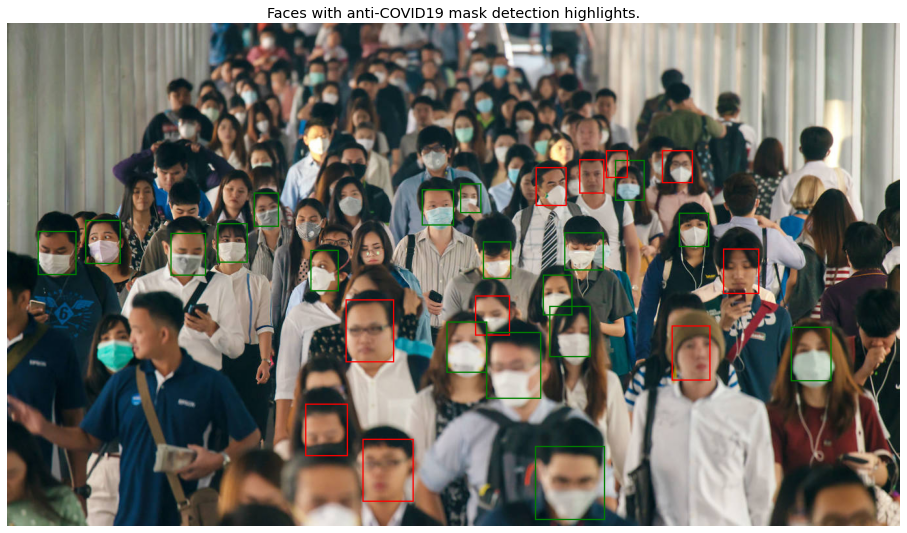

In [32]:
highlight_field(images[3], f_coords, f_preds, field='COVID-19 correct',
                title='Faces with anti-COVID19 mask detection highlights.')

### Test #04

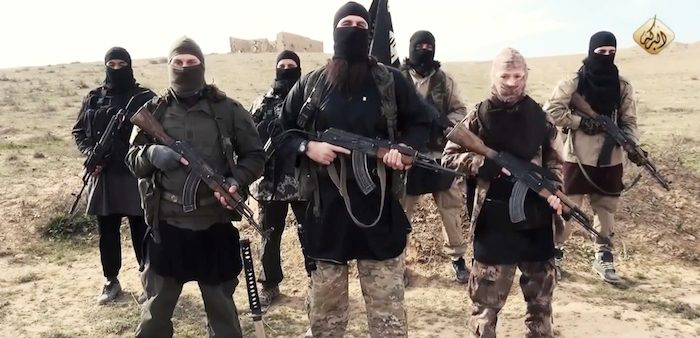

In [33]:
images[4]

/home/jakub/Dokumenty/venv36/lib/python3.6/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


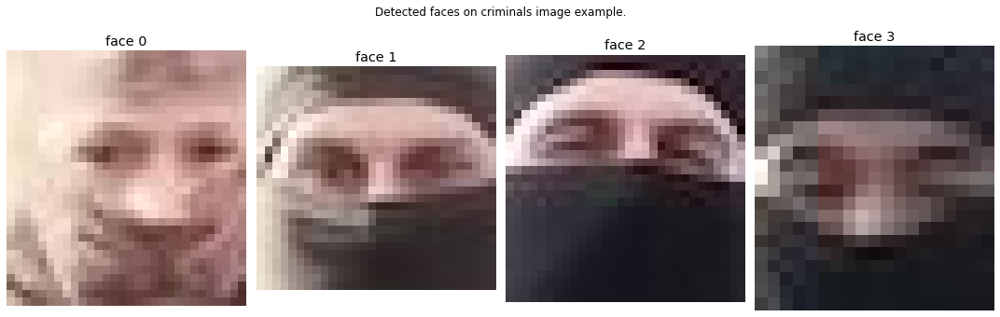

In [34]:
f_coords, f_images = face_images(images[4])
f_titles = [f'face {i}' for i in range(len(f_images))]
show_images(f_images, f_titles, suptitle='Detected faces on criminals image example.')

In [35]:
f_preds = get_predictions(f_images, return_df=True)
f_preds

,face 0,face 1,face 2,face 3
anti-COVID19 mask,0,0,1,0
balaclava,0,1,0,1
scarf,1,1,0,0
other cloth,0,1,0,1
hair,0,0,0,1
handkerchief,1,1,0,1
hands,0,1,0,1
beard,0,1,0,0
glasses,0,1,1,0
head covering,0,1,1,0


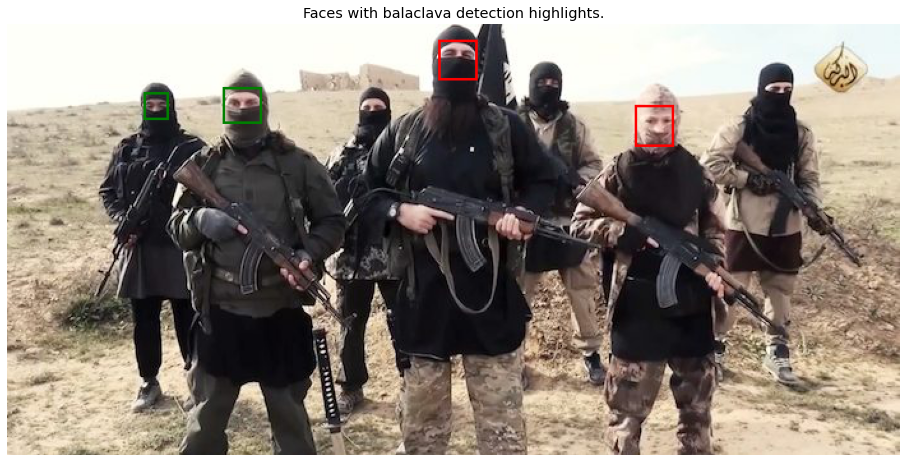

In [36]:
highlight_field(images[4], f_coords, f_preds, field='balaclava',
                title='Faces with balaclava detection highlights.')

### Test #05

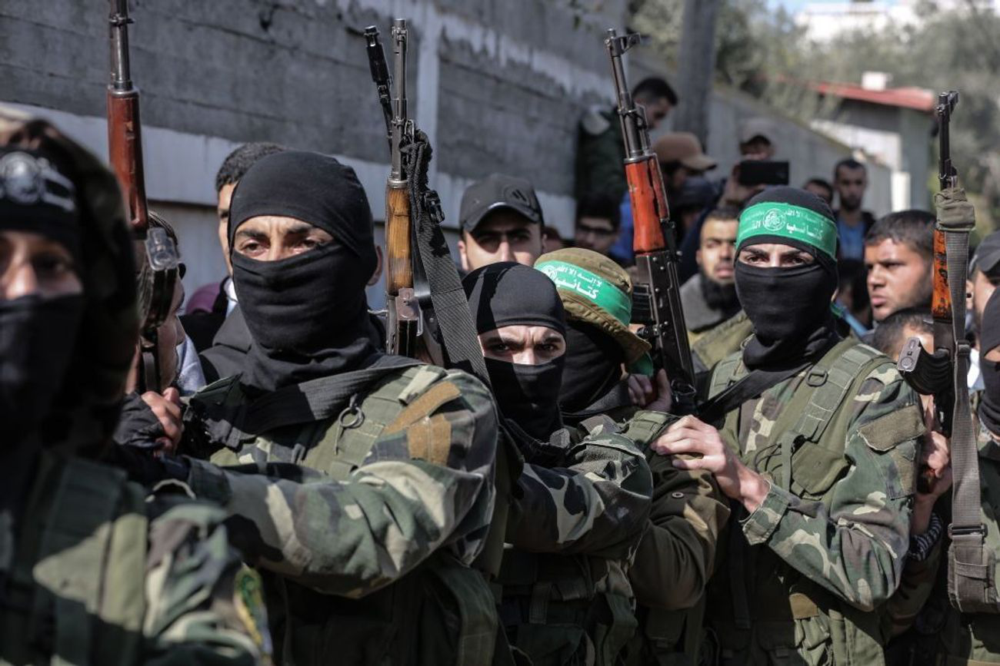

In [37]:
images[5]

/home/jakub/Dokumenty/venv36/lib/python3.6/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


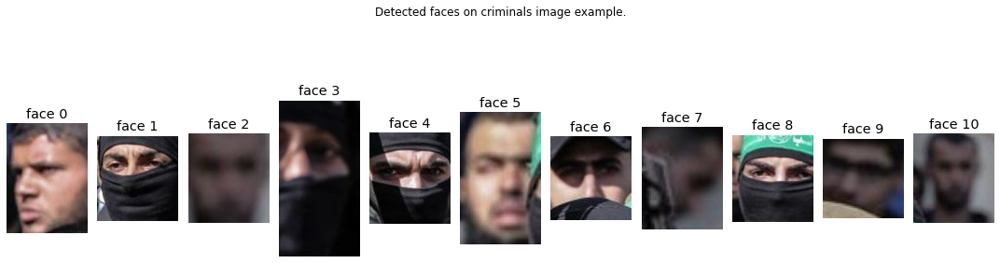

In [38]:
f_coords, f_images = face_images(images[5])
f_titles = [f'face {i}' for i in range(len(f_images))]
show_images(f_images, f_titles, suptitle='Detected faces on criminals image example.')

In [39]:
f_preds = get_predictions(f_images, return_df=True)
f_preds

,face 0,face 1,face 2,face 3,face 4,face 5,face 6,face 7,face 8,face 9,face 10
anti-COVID19 mask,0,1,0,1,1,0,0,0,1,0,0
balaclava,0,1,0,1,1,0,1,0,1,0,0
scarf,0,1,0,1,0,0,0,0,0,0,1
other cloth,0,1,0,1,1,0,0,0,0,0,0
hair,1,1,0,1,1,0,1,1,0,0,0
handkerchief,0,1,0,1,0,0,0,0,0,0,0
hands,0,1,0,1,0,1,1,0,0,0,0
beard,0,1,0,1,1,0,0,0,0,0,1
glasses,0,0,0,1,0,0,0,0,0,0,1
head covering,0,0,0,1,0,0,1,0,1,1,1


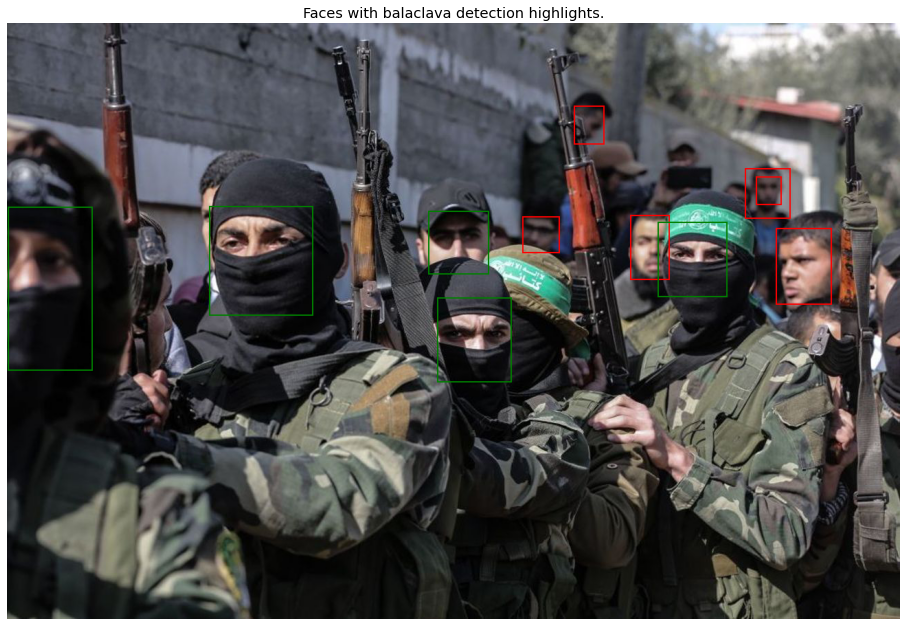

In [40]:
highlight_field(images[5], f_coords, f_preds, field='balaclava',
                title='Faces with balaclava detection highlights.')

## Ending notes

In [58]:
measures = np.array([
    [0.92, 0.94, 0.88],
    [0.59, 0.74, 0.02],
    [0.66, 0.79, 0.01],
    [0.65, 0.78, 0.10],
    [0.78, 0.84, 0.70],
    [0.61, 0.76, 0.01],
    [0.63, 0.77, 0.13],
    [0.68, 0.81, 0.09],
    [0.60, 0.73, 0.21],
    [0.69, 0.80, 0.35],
    [0.64, 0.77, 0.18],
    [0.92, 0.94, 0.91],
])
en_df = pd.DataFrame(measures, index=FIELDS, columns=['Acc.', 'F(0)', 'F(1)'])
en_df = en_df.style.background_gradient(cmap=plt.get_cmap('Wistia')).set_precision(2)
en_df

,Acc.,F(0),F(1)
anti-COVID19 mask,0.92,0.94,0.88
balaclava,0.59,0.74,0.02
scarf,0.66,0.79,0.01
other cloth,0.65,0.78,0.10
hair,0.78,0.84,0.70
handkerchief,0.61,0.76,0.01
hands,0.63,0.77,0.13
beard,0.68,0.81,0.09
glasses,0.60,0.73,0.21
head covering,0.69,0.80,0.35


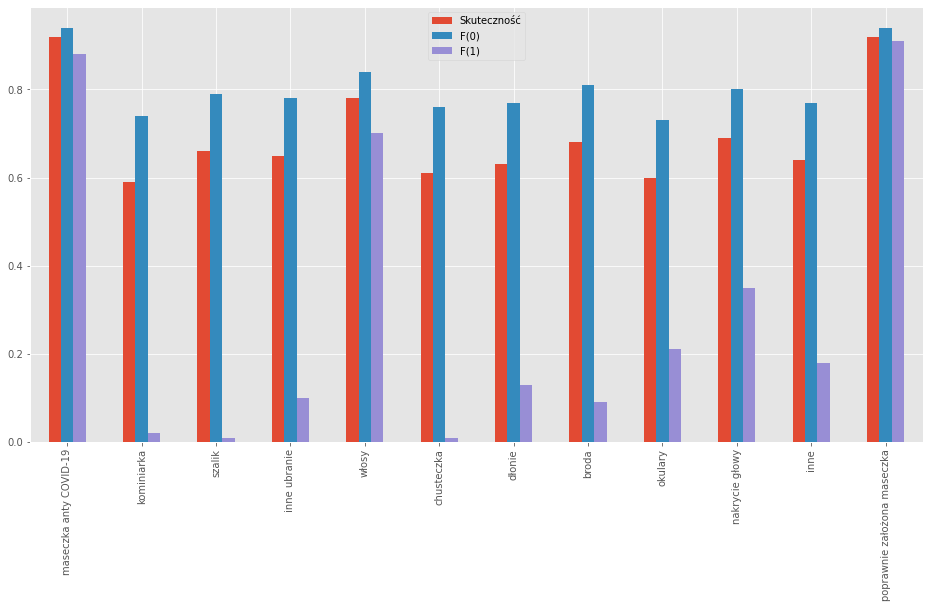

In [59]:
en_df = pd.DataFrame(measures, index=FIELDS, columns=['Acc.', 'F(0)', 'F(1)'])
if LANG == 'pl':
    en_df = en_df.rename(index=dict(zip(FIELDS, FIELDS_PL)), columns=dict({'Acc.': 'Skuteczność'}))
ax = en_df.plot(kind='bar', figsize=(16, 8))